# InfoGAN

https://arxiv.org/abs/1606.03657

"An information-theoretic extension to the Generative Adversarial Network that is able to learn disentangled representations in a completely unsupervised manner. InfoGAN is a generative adversarial network that also maximizes the mutual information between a small subset of the latent variables and the observation."

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
      c_dim: the number of latent code dimensions - 
    '''
    def __init__(self, im_chan=1, hidden_dim=64, c_dim=10):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
        )
        self.d_layer = self.make_disc_block(hidden_dim * 2, 1, final_layer=True)
        self.q_layer = nn.Sequential(
            self.make_disc_block(hidden_dim * 2, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 2 * c_dim, kernel_size=1, final_layer=True)
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        intermediate_pred = self.disc(image)
        disc_pred = self.d_layer(intermediate_pred)
        q_pred = self.q_layer(intermediate_pred)
        return disc_pred.view(len(disc_pred), -1), q_pred.view(len(q_pred), -1)

In [4]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        This will be the noise vector of shape (n_samples, z_dim).
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes).
    '''
    combined = torch.cat([x.float(), y.float()], 1)
    return combined

# Train

* mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
* adv_criterion: the vanilla GAN loss function
* c_criterion: the additional mutual information term
* c_lambda: the weight on the c_criterion
* n_epochs: the number of times you iterate through the entire dataset when training
* z_dim: the dimension of the noise vector
* c_dim: the dimension of the InfoGAN latent code
* display_step: how often to display/visualize the images
* batch_size: the number of images per forward/backward pass
* lr: the learning rate
* device: the device type

In [5]:
from torch.distributions.normal import Normal
adv_criterion = nn.BCEWithLogitsLoss()
c_criterion = lambda c_true, mean, logvar: Normal(mean, logvar.exp()).log_prob(c_true).mean()
c_lambda = 0.1
mnist_shape = (1, 28, 28)
n_epochs = 80
z_dim = 64
c_dim = 2
display_step = 500
batch_size = 128
# InfoGAN uses two different learning rates for the models
d_lr = 2e-4
g_lr = 1e-3
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [6]:
gen = Generator(input_dim=z_dim + c_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=g_lr)
disc = Discriminator(im_chan=mnist_shape[0], c_dim=c_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=d_lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1, step 500: Generator loss: 0.746677769780159, discriminator loss: 0.7601584639549256


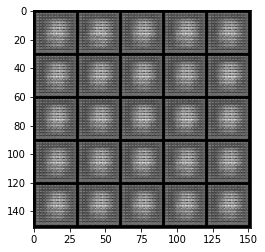

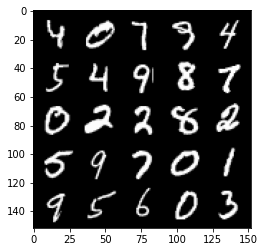

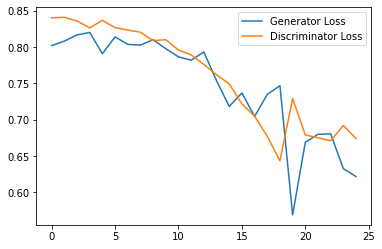

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: 0.7003596992492676, discriminator loss: 0.6355990460515022


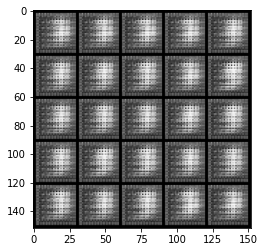

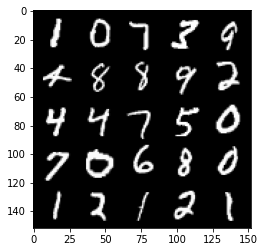

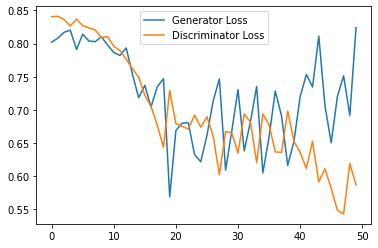

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3, step 1500: Generator loss: 1.050561129629612, discriminator loss: 0.4318857644051313


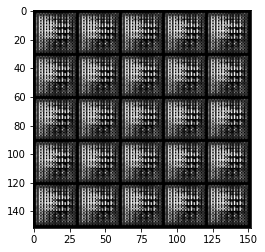

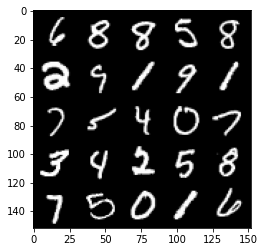

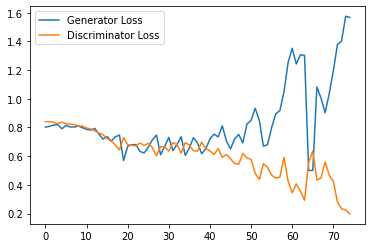

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 2.191943494915962, discriminator loss: 0.10747702361643315


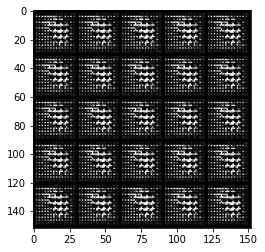

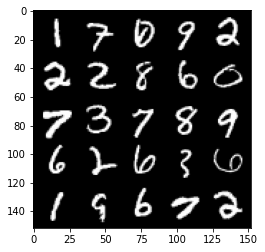

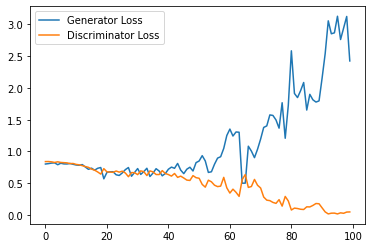

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5, step 2500: Generator loss: 2.9871990218162536, discriminator loss: 0.04515023556724191


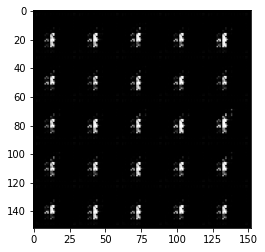

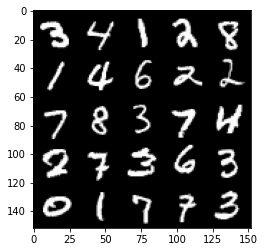

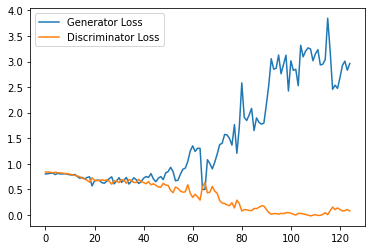

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 3.238939709186554, discriminator loss: 0.08154634004458786


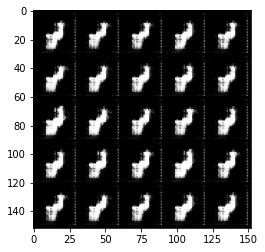

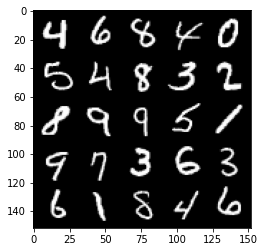

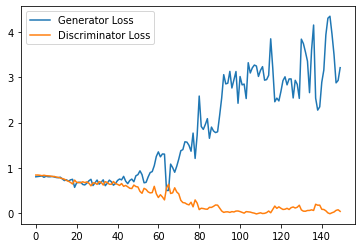

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7, step 3500: Generator loss: 2.3674554839134214, discriminator loss: 0.22179284718446435


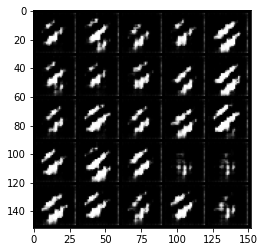

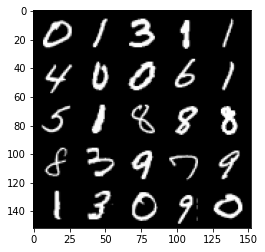

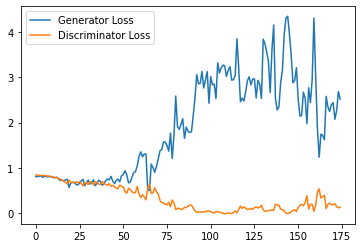

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 1.962348595738411, discriminator loss: 0.31845336362719534


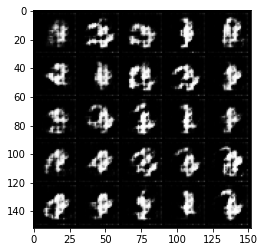

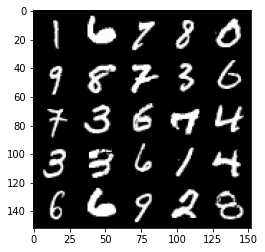

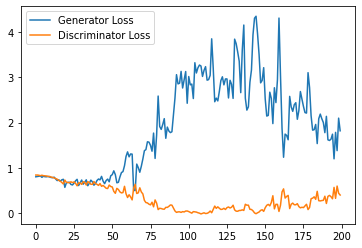

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9, step 4500: Generator loss: 1.7771896188259124, discriminator loss: 0.3765613530576229


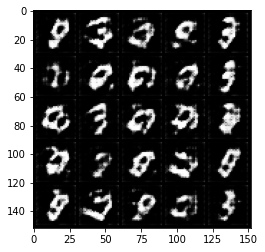

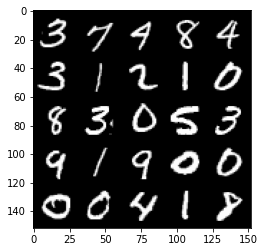

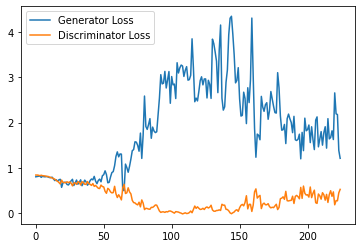

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 1.4782334867715836, discriminator loss: 0.4258860125541687


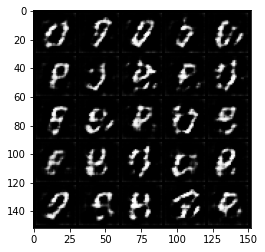

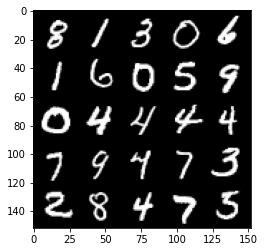

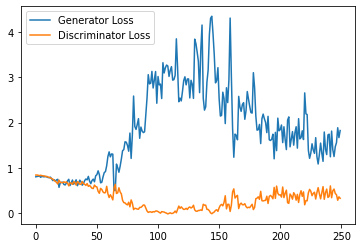

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11, step 5500: Generator loss: 1.6330357362031938, discriminator loss: 0.40328207045793535


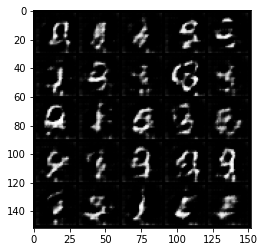

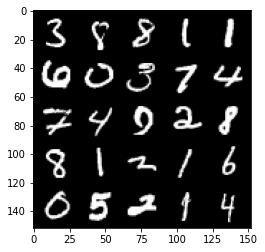

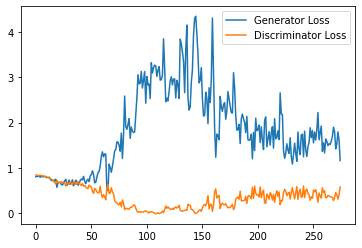

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 1.7388030205965042, discriminator loss: 0.41475462779402733


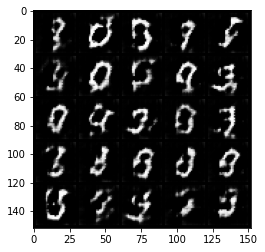

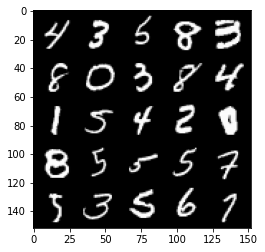

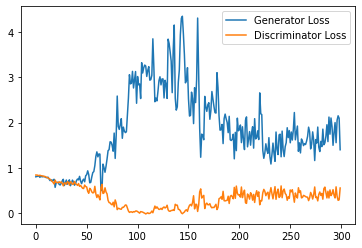

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13, step 6500: Generator loss: 1.545967302083969, discriminator loss: 0.44591008946299554


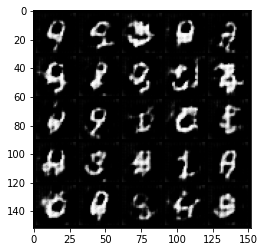

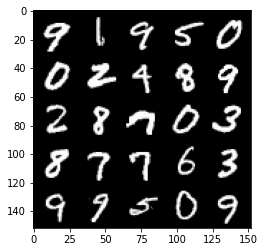

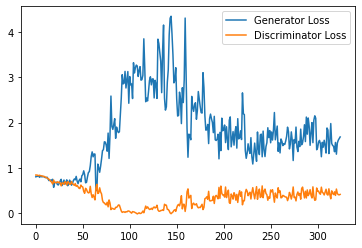

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 1.4945724059343337, discriminator loss: 0.4590329588353634


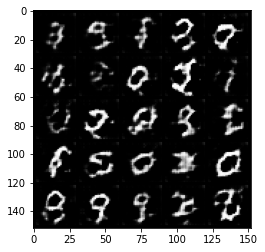

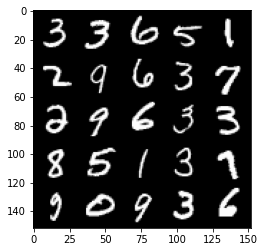

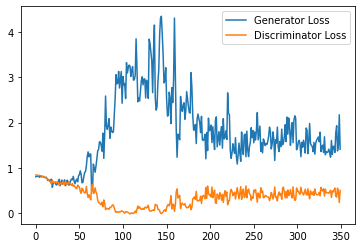

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15, step 7500: Generator loss: 1.3986846528053283, discriminator loss: 0.456633043885231


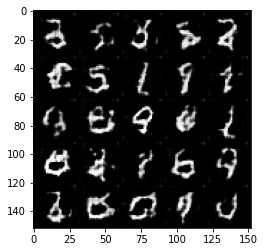

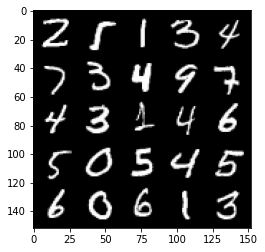

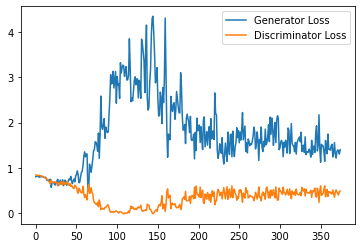

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 1.4985708705186844, discriminator loss: 0.4602550241947174


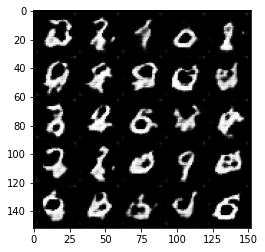

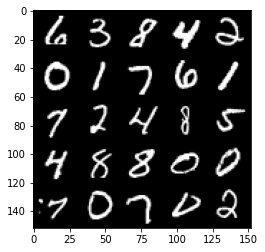

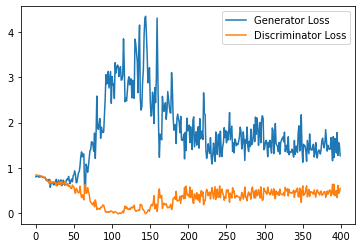

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18, step 8500: Generator loss: 1.4433846025466919, discriminator loss: 0.5106699708104133


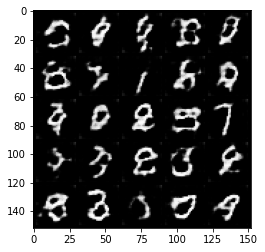

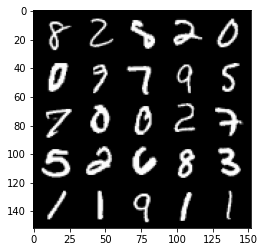

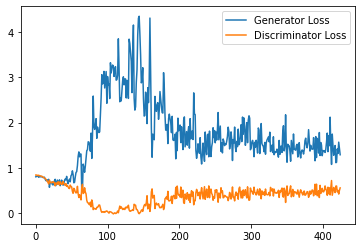

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 1.3615346170663833, discriminator loss: 0.4950260596871376


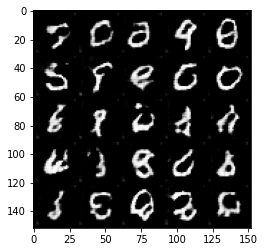

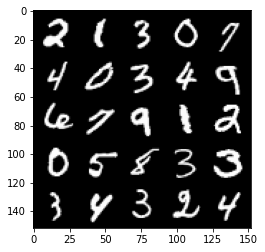

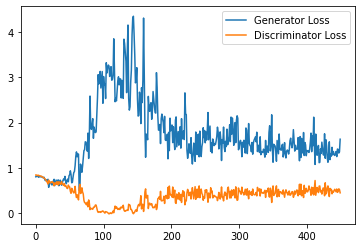

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20, step 9500: Generator loss: 1.3588488495349884, discriminator loss: 0.48913800579309463


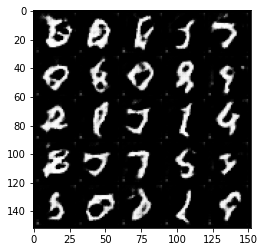

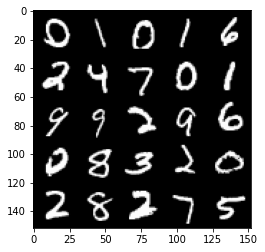

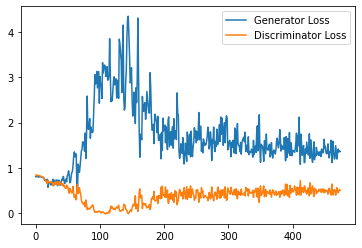

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 1.3129554154872893, discriminator loss: 0.5014185874462128


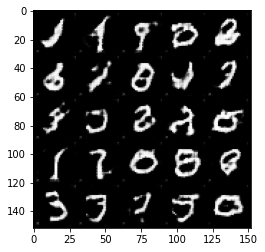

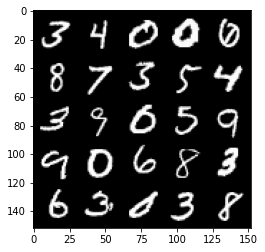

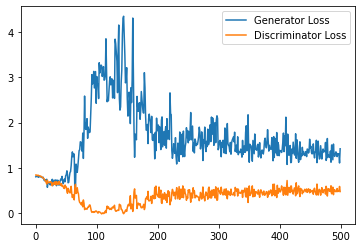

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22, step 10500: Generator loss: 1.287593161702156, discriminator loss: 0.5378501864671708


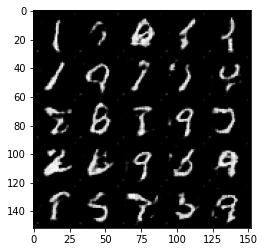

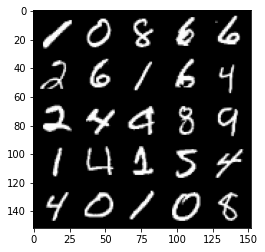

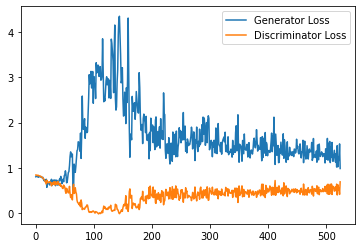

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 11000: Generator loss: 1.3235627546310424, discriminator loss: 0.538446260035038


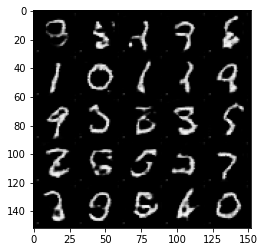

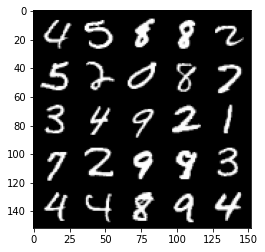

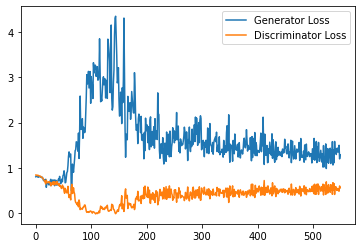

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24, step 11500: Generator loss: 1.2510127552747727, discriminator loss: 0.5399702147841453


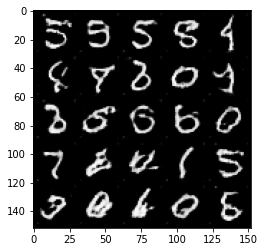

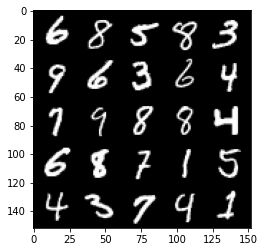

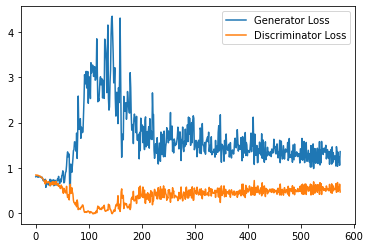

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 12000: Generator loss: 1.2273678170442581, discriminator loss: 0.5612599107623101


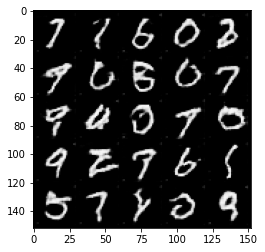

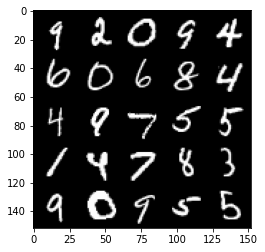

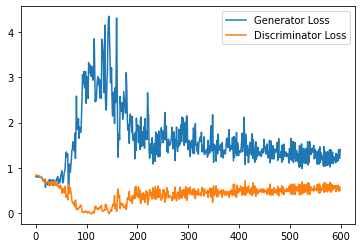

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26, step 12500: Generator loss: 1.215739547729492, discriminator loss: 0.5711215546727181


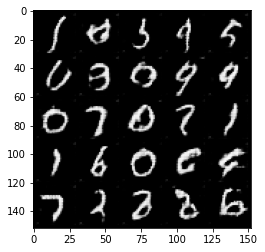

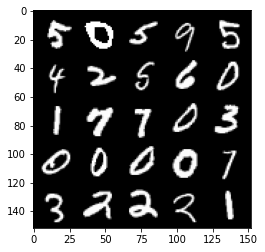

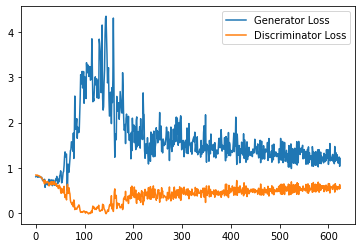

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 13000: Generator loss: 1.2418122396469116, discriminator loss: 0.5667887632250785


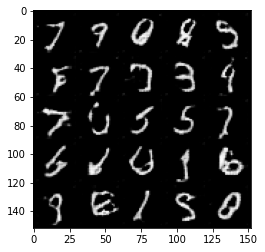

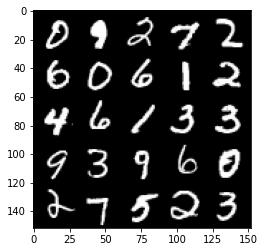

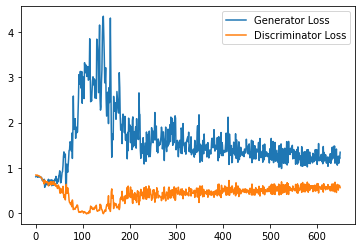

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28, step 13500: Generator loss: 1.1535770473480225, discriminator loss: 0.5835252727866173


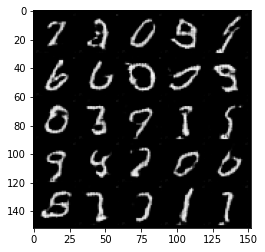

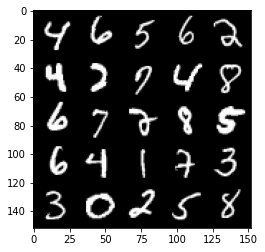

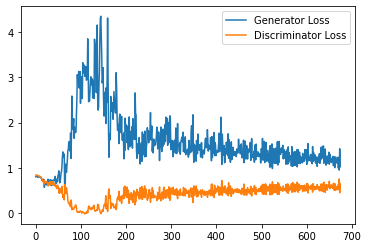

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 14000: Generator loss: 1.1520191498994827, discriminator loss: 0.5800209451913834


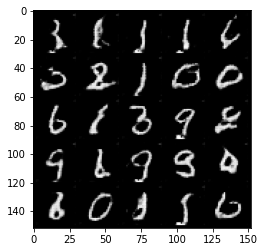

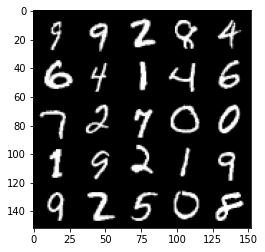

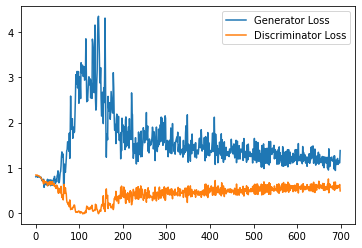

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30, step 14500: Generator loss: 1.1072111661434174, discriminator loss: 0.5829786254167557


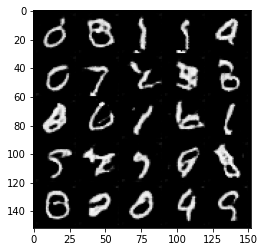

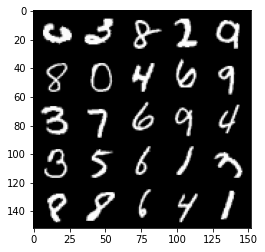

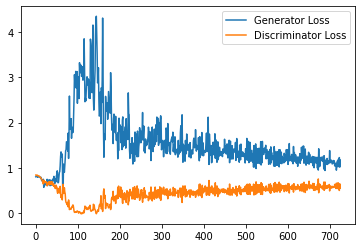

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 15000: Generator loss: 1.1161336504220962, discriminator loss: 0.5802764104008674


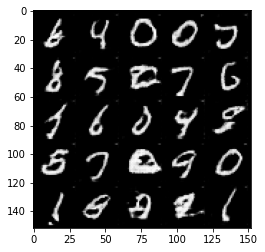

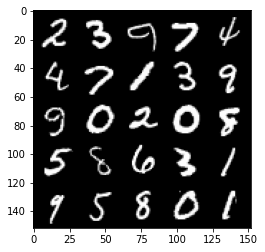

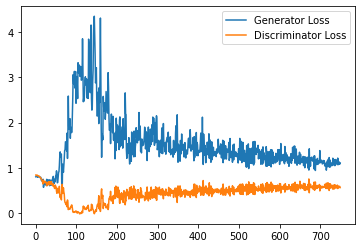

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33, step 15500: Generator loss: 1.1010813425779342, discriminator loss: 0.5887598634958268


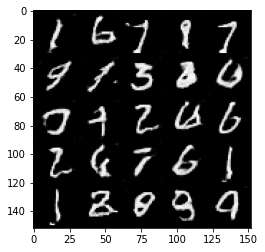

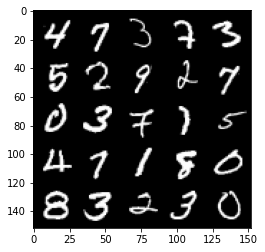

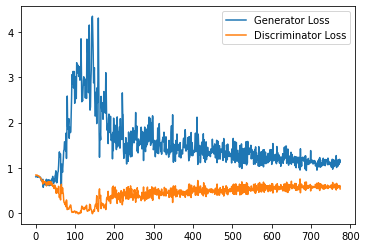

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 1.1107501292228699, discriminator loss: 0.578516464650631


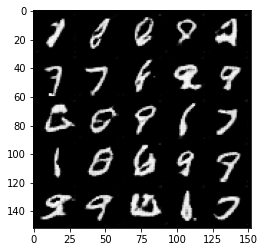

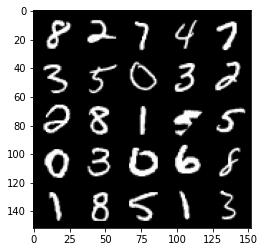

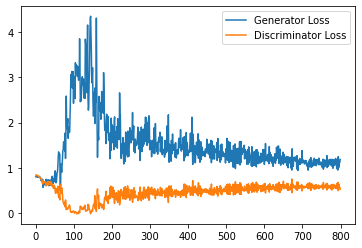

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35, step 16500: Generator loss: 1.121978144288063, discriminator loss: 0.5780366229414939


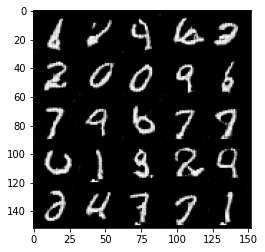

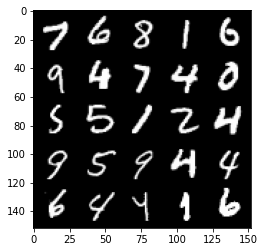

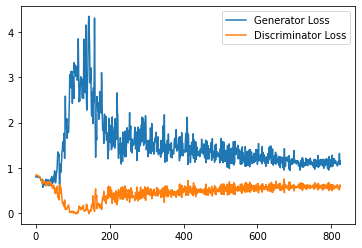

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 1.1222534337043761, discriminator loss: 0.5702087903618812


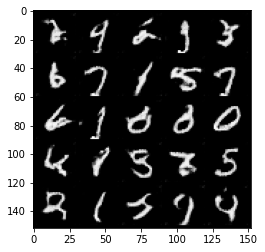

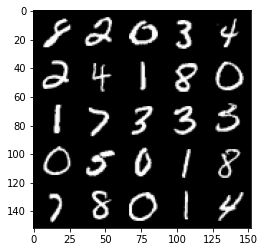

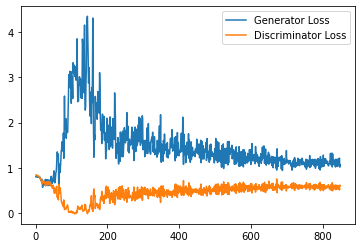

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37, step 17500: Generator loss: 1.104272677063942, discriminator loss: 0.5628756546378135


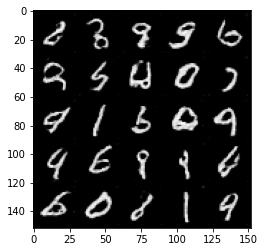

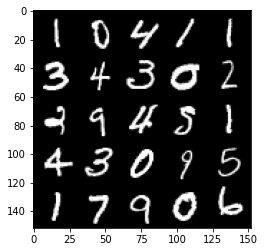

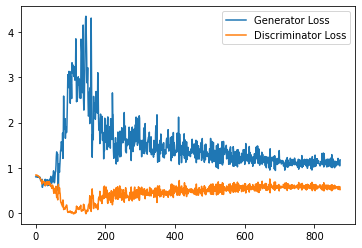

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 1.1047035785913468, discriminator loss: 0.5671420367956161


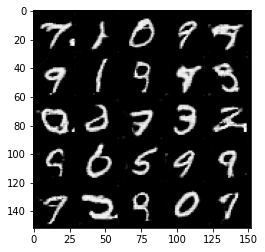

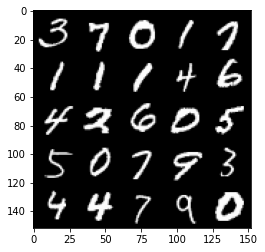

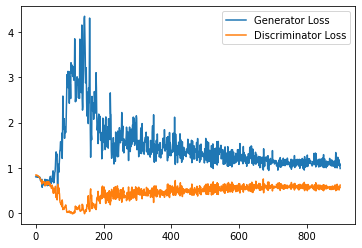

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39, step 18500: Generator loss: 1.1182946840524672, discriminator loss: 0.5594711356163025


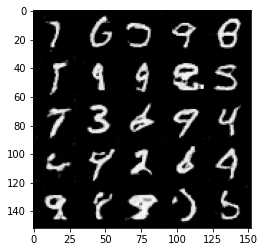

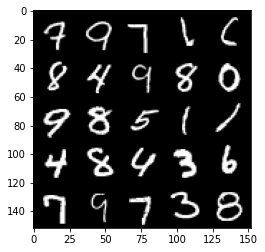

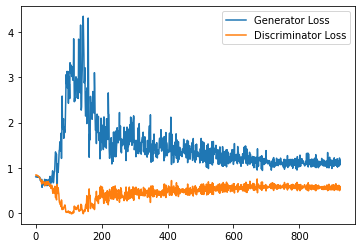

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 19000: Generator loss: 1.0856452189683914, discriminator loss: 0.5680738369226456


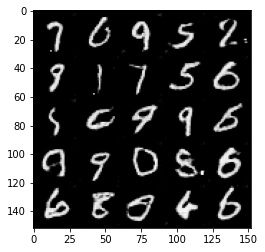

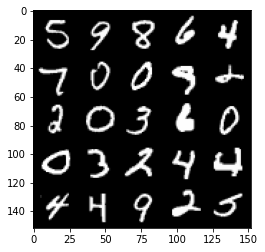

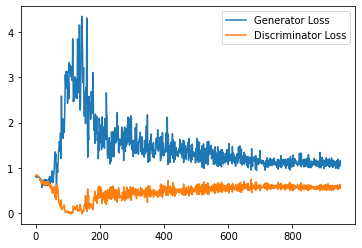

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41, step 19500: Generator loss: 1.132353735923767, discriminator loss: 0.5650940279364586


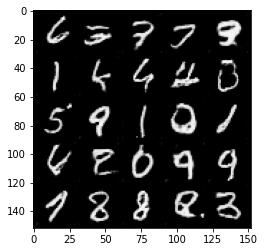

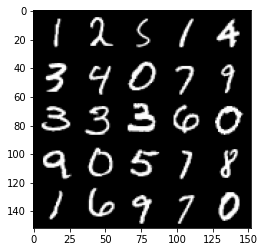

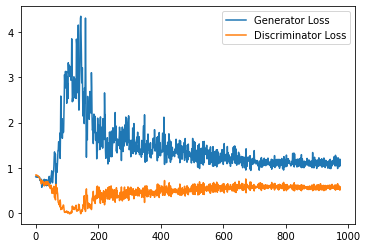

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 20000: Generator loss: 1.1343571232557297, discriminator loss: 0.5641727058291435


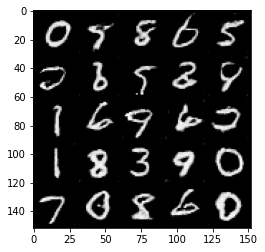

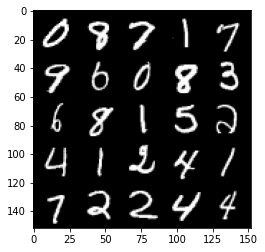

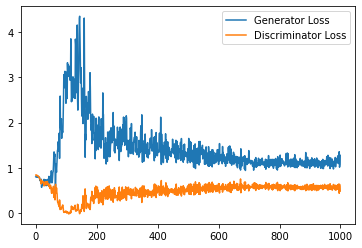

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43, step 20500: Generator loss: 1.1001725971698761, discriminator loss: 0.5608175117969513


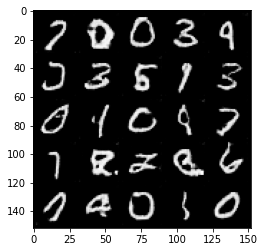

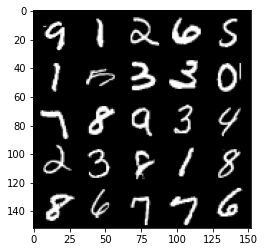

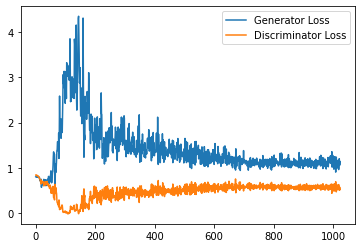

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 21000: Generator loss: 1.1219836992025376, discriminator loss: 0.557337276160717


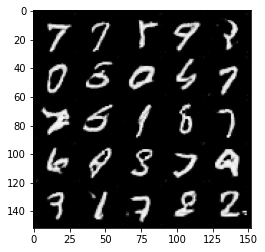

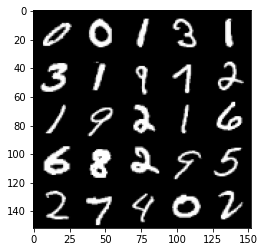

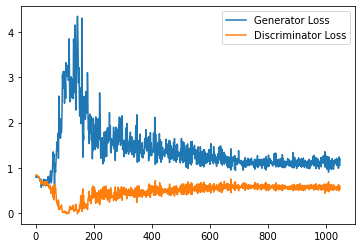

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45, step 21500: Generator loss: 1.1059876548051835, discriminator loss: 0.5588001645803452


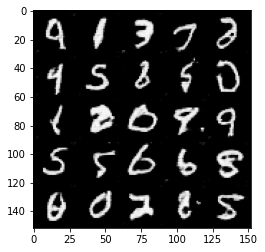

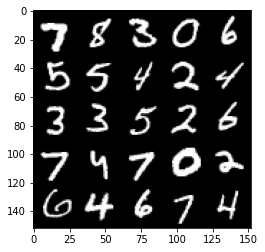

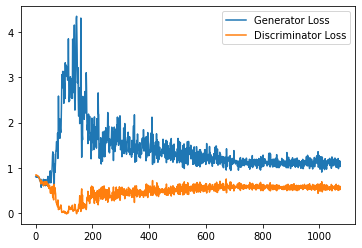

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 22000: Generator loss: 1.0890962162017823, discriminator loss: 0.5558395400047302


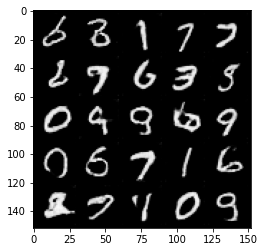

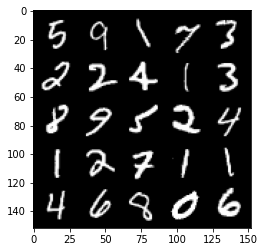

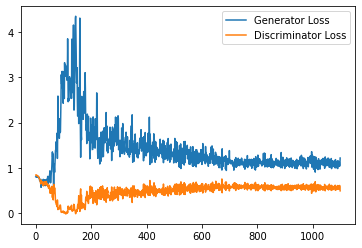

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47, step 22500: Generator loss: 1.087501186490059, discriminator loss: 0.5523354379534722


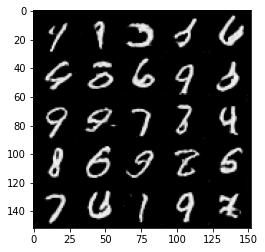

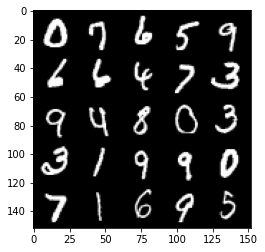

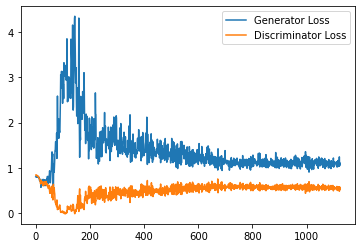

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49, step 23000: Generator loss: 1.1310437026023865, discriminator loss: 0.5525481072068215


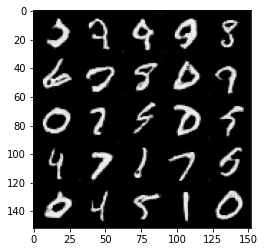

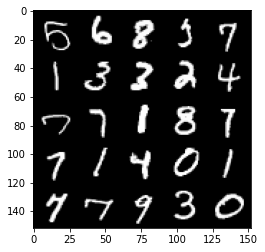

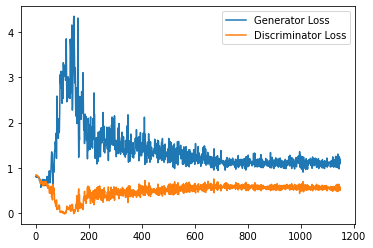

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 50, step 23500: Generator loss: 1.109516736626625, discriminator loss: 0.5582064583301544


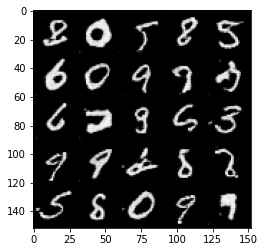

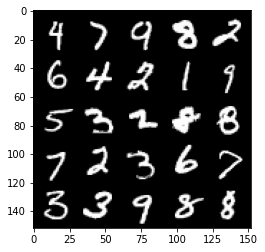

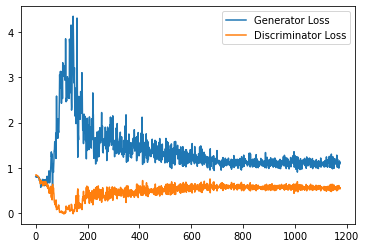

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 51, step 24000: Generator loss: 1.097660815358162, discriminator loss: 0.5478948684334755


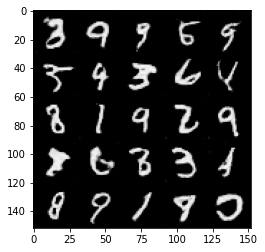

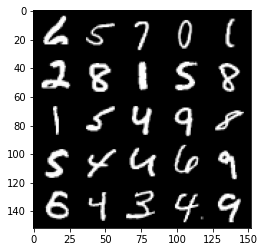

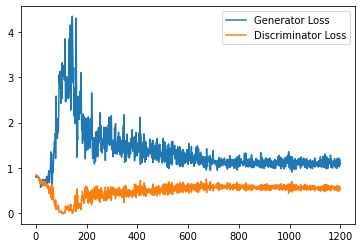

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 52, step 24500: Generator loss: 1.1356851577758789, discriminator loss: 0.5521840105056762


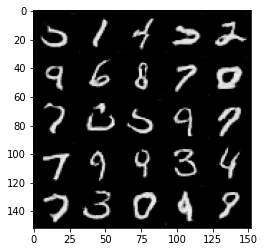

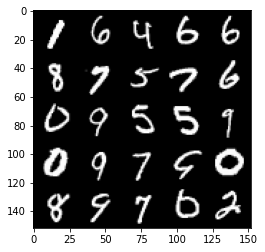

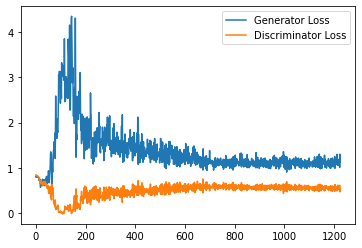

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 53, step 25000: Generator loss: 1.085298791527748, discriminator loss: 0.5534074928164482


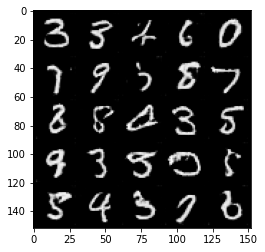

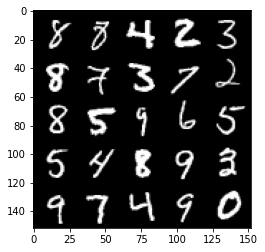

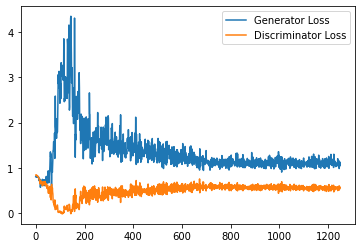

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 54, step 25500: Generator loss: 1.114605036497116, discriminator loss: 0.5522333753108978


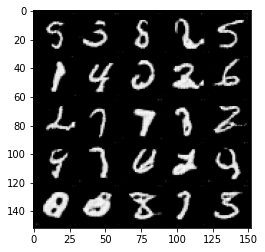

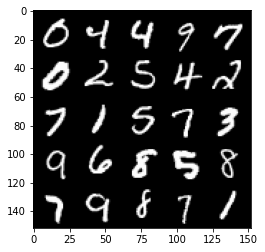

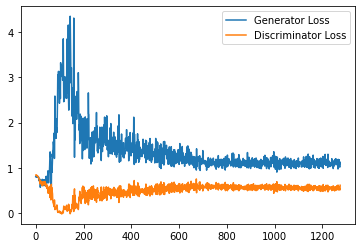

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 55, step 26000: Generator loss: 1.0982845071554184, discriminator loss: 0.5512047302722931


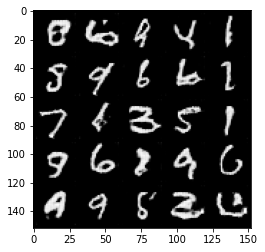

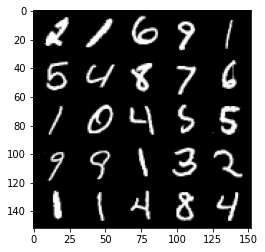

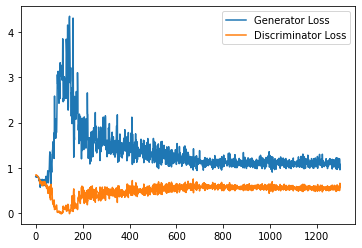

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 56, step 26500: Generator loss: 1.0996279990673066, discriminator loss: 0.550108694434166


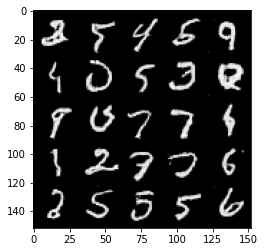

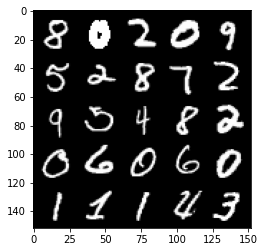

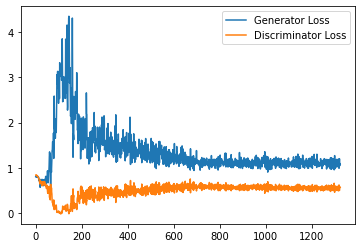

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 57, step 27000: Generator loss: 1.105459716796875, discriminator loss: 0.5462636442184449


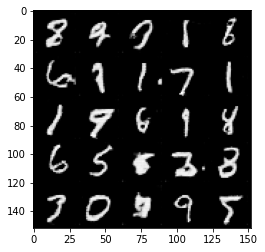

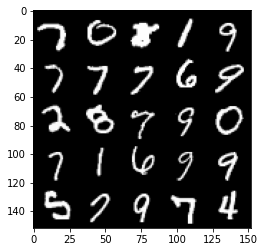

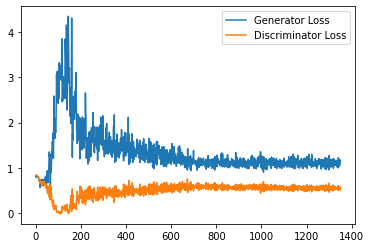

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 58, step 27500: Generator loss: 1.0889830491542816, discriminator loss: 0.5494047982692718


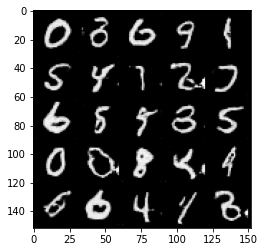

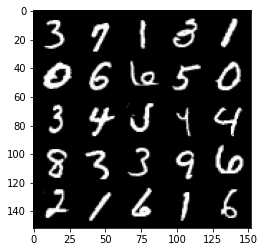

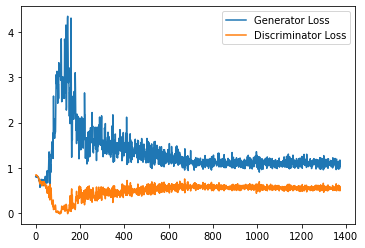

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 59, step 28000: Generator loss: 1.0915339900255203, discriminator loss: 0.5528251955509186


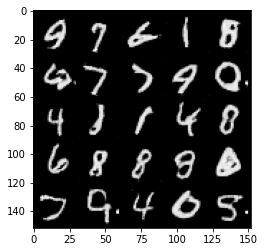

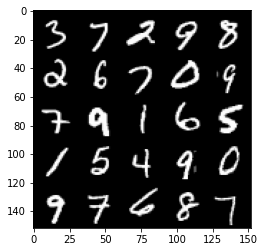

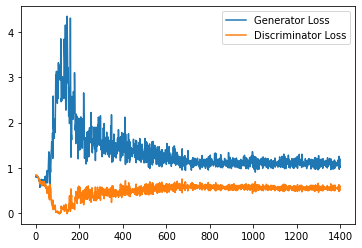

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 60, step 28500: Generator loss: 1.107468873858452, discriminator loss: 0.5490763683915139


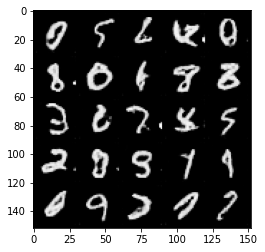

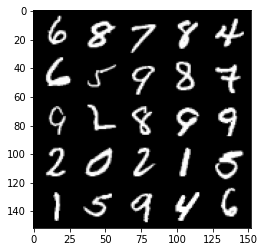

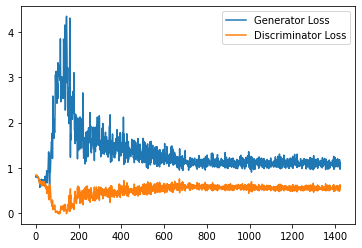

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 61, step 29000: Generator loss: 1.097402775645256, discriminator loss: 0.547888057410717


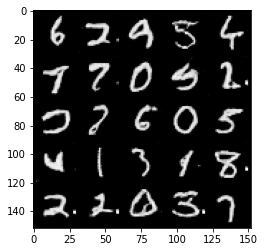

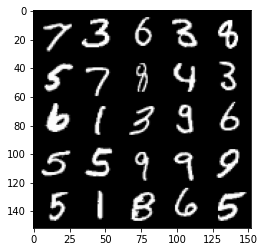

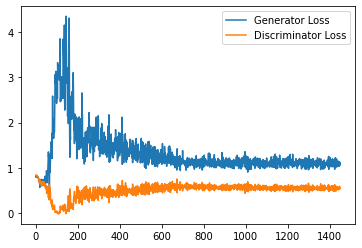

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 62, step 29500: Generator loss: 1.0981085931062697, discriminator loss: 0.5469431046843529


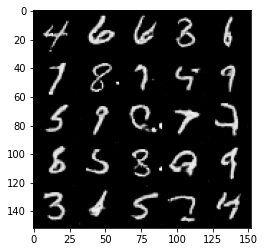

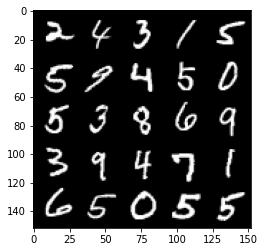

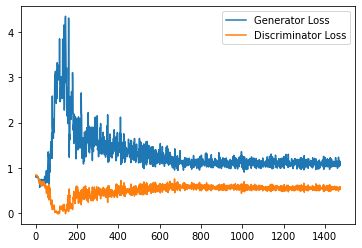

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 63, step 30000: Generator loss: 1.0915755770206452, discriminator loss: 0.545736617565155


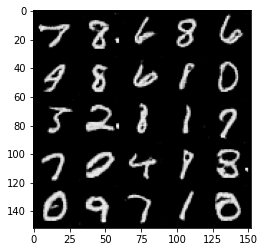

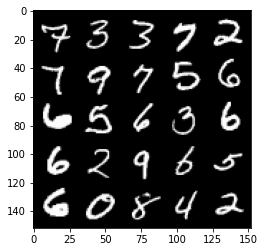

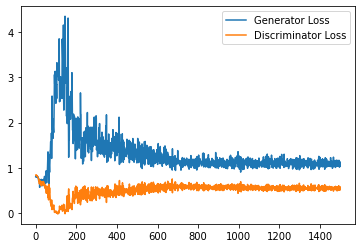

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 65, step 30500: Generator loss: 1.087250491142273, discriminator loss: 0.5465696573853492


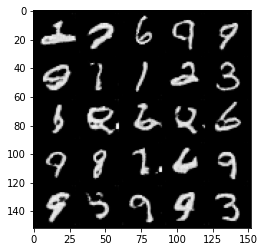

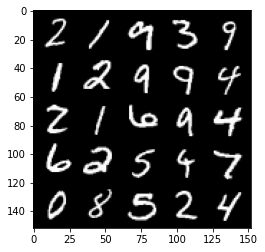

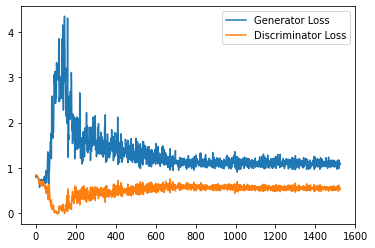

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 66, step 31000: Generator loss: 1.1057217818498613, discriminator loss: 0.5468119683861733


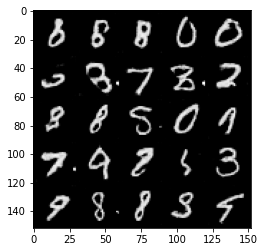

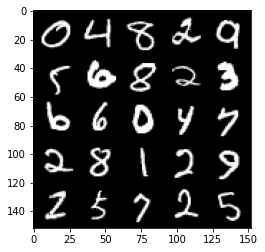

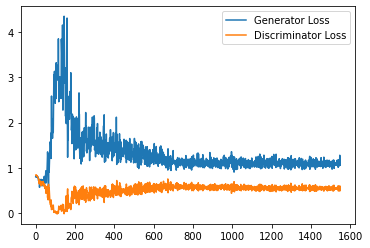

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 67, step 31500: Generator loss: 1.1109720461368562, discriminator loss: 0.542425646841526


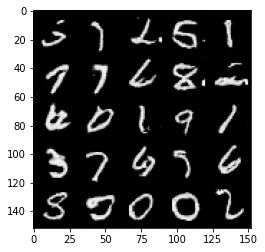

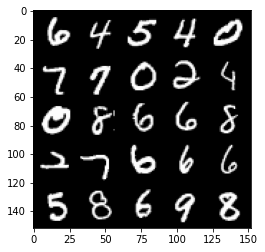

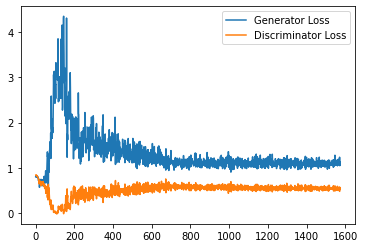

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 68, step 32000: Generator loss: 1.1260244358778, discriminator loss: 0.5435876085758209


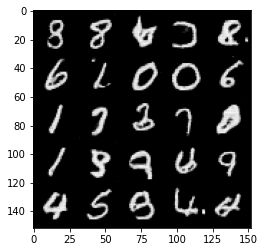

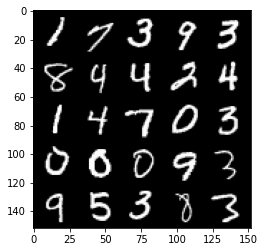

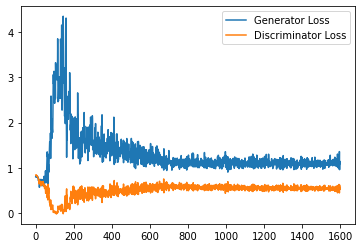

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 69, step 32500: Generator loss: 1.1034632914066316, discriminator loss: 0.5391772835254669


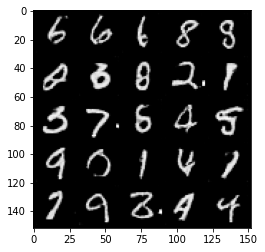

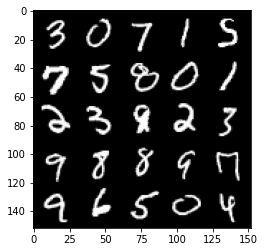

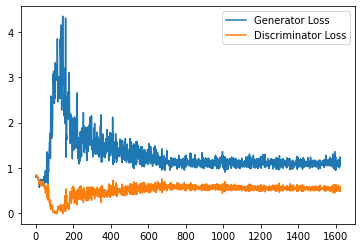

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 70, step 33000: Generator loss: 1.0953985887765885, discriminator loss: 0.5380697950124741


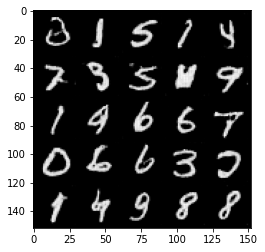

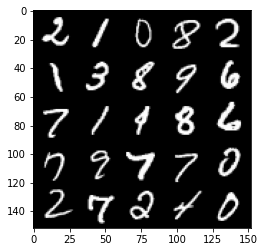

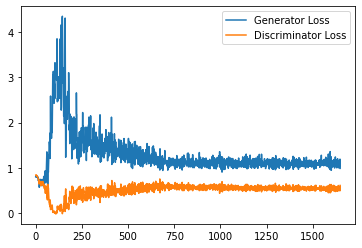

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 71, step 33500: Generator loss: 1.1160803604125977, discriminator loss: 0.53027029722929


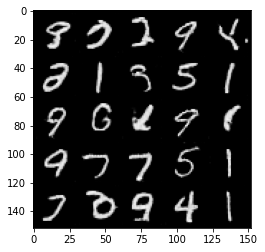

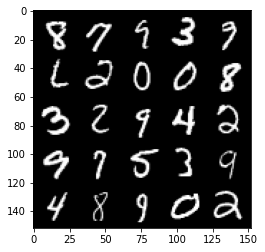

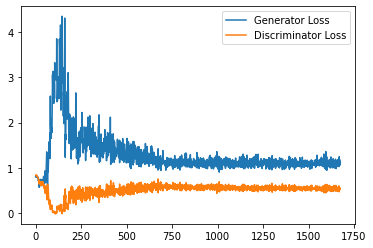

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 72, step 34000: Generator loss: 1.0974303184747696, discriminator loss: 0.5290430049300194


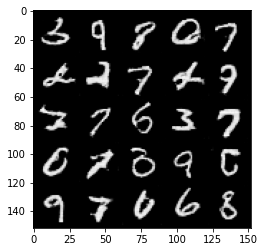

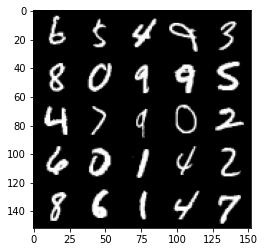

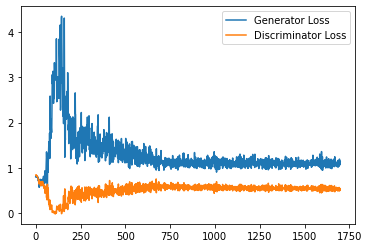

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 73, step 34500: Generator loss: 1.1160686160326003, discriminator loss: 0.5317205936908722


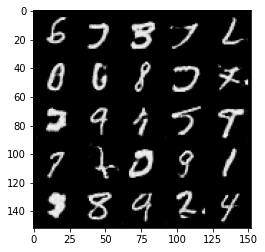

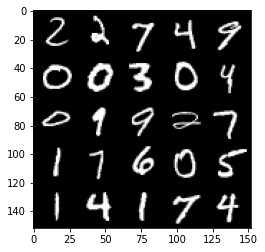

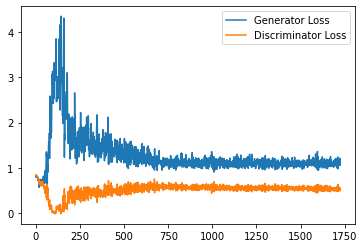

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 74, step 35000: Generator loss: 1.117865662932396, discriminator loss: 0.5284770826101303


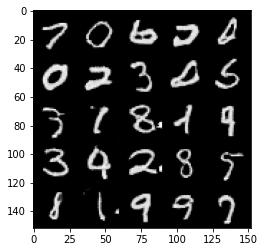

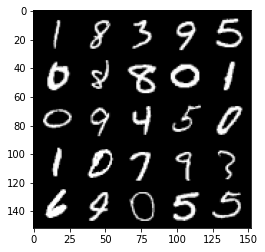

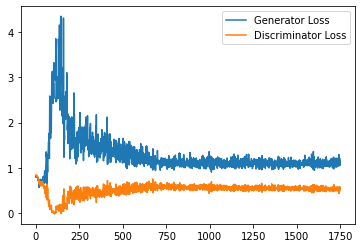

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 75, step 35500: Generator loss: 1.135908548116684, discriminator loss: 0.5256227096319198


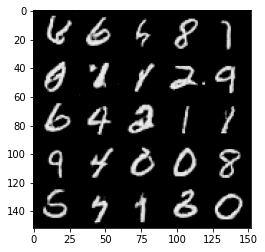

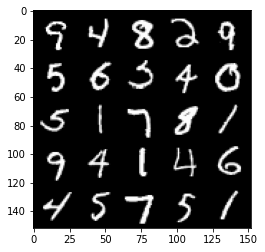

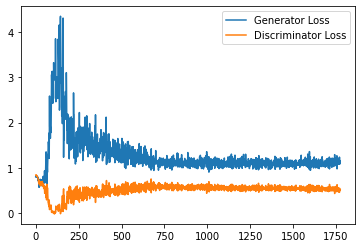

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 76, step 36000: Generator loss: 1.1342926090955734, discriminator loss: 0.5232507974505425


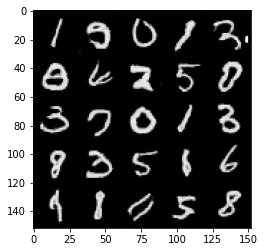

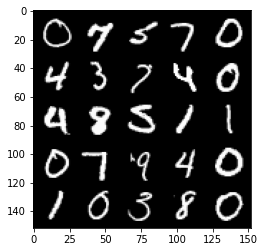

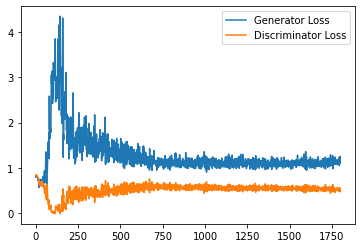

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 77, step 36500: Generator loss: 1.1380458116531371, discriminator loss: 0.5186530172228813


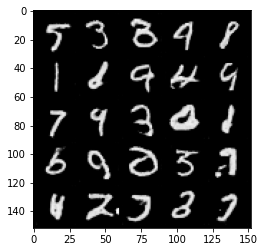

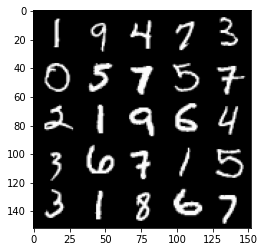

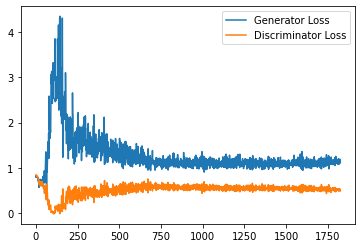

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 78, step 37000: Generator loss: 1.1606456068754196, discriminator loss: 0.5213662783503532


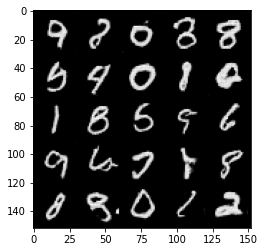

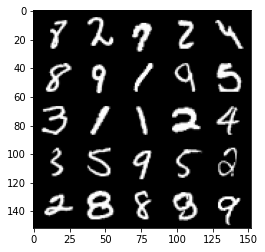

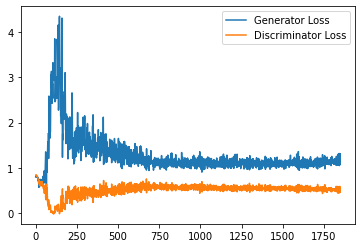

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 79, step 37500: Generator loss: 1.1660457941293716, discriminator loss: 0.5189856658577919


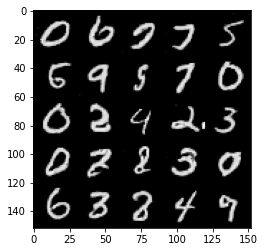

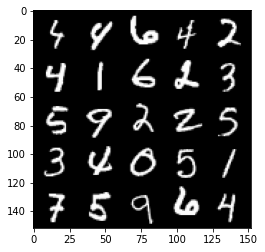

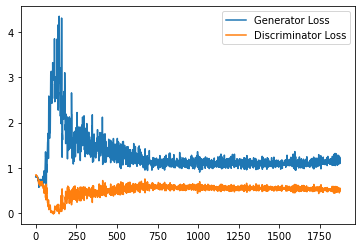

In [7]:
cur_step = 0
generator_losses = []
discriminator_losses = []

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        c_labels = get_noise(cur_batch_size, c_dim, device=device)    
        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        # Combine the noise vectors and the one-hot labels for the generator
        noise_and_labels = combine_vectors(fake_noise, c_labels)
        # Generate the conditioned fake images
        fake = gen(noise_and_labels)
        
        # Get the discriminator's predictions
        disc_fake_pred, disc_q_pred = disc(fake.detach())
        disc_q_mean = disc_q_pred[:, :c_dim]
        disc_q_logvar = disc_q_pred[:, c_dim:]
        mutual_information = c_criterion(c_labels, disc_q_mean, disc_q_logvar)
        disc_real_pred, _ = disc(real)
        disc_fake_loss = adv_criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = adv_criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2 - c_lambda * mutual_information
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        disc_fake_pred, disc_q_pred = disc(fake)
        disc_q_mean = disc_q_pred[:, :c_dim]
        disc_q_logvar = disc_q_pred[:, c_dim:]
        mutual_information = c_criterion(c_labels, disc_q_mean, disc_q_logvar)
        gen_loss = adv_criterion(disc_fake_pred, torch.ones_like(disc_fake_pred)) - c_lambda * mutual_information
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        cur_step += 1

In [8]:
gen = gen.eval()

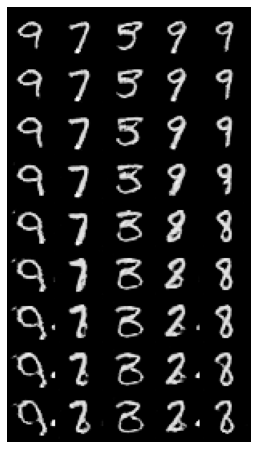

In [9]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)

def interpolate_class(n_view=5):
    interpolation_noise = get_noise(n_view, z_dim, device=device).repeat(n_interpolation, 1)
    first_label = get_noise(1, c_dim).repeat(n_view, 1)[None, :]
    second_label = first_label.clone()
    first_label[:, :, 0] =  -2
    second_label[:, :, 0] =  2
    

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label
    interpolation_labels = interpolation_labels.view(-1, c_dim)

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation * n_view, nrow=n_view, show=False)

plt.figure(figsize=(8, 8))
interpolate_class()
_ = plt.axis('off')

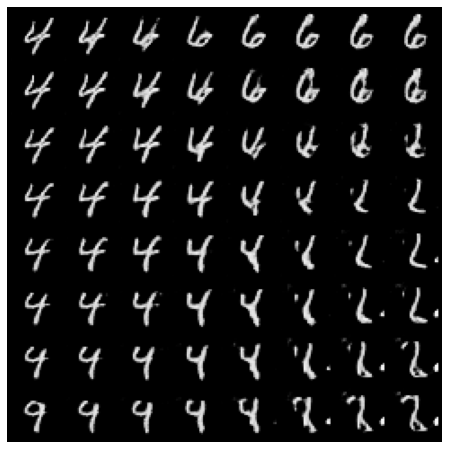

In [10]:
import math

### Change me! ###
n_interpolation = 8 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)

def interpolate_class():
    interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation * n_interpolation, 1)
    first_label = get_noise(1, c_dim).repeat(n_interpolation * n_interpolation, 1)
    
    # Calculate the interpolation vector between the two labels
    first_label = torch.linspace(-2, 2, n_interpolation).repeat(n_interpolation)
    second_label = torch.linspace(-2, 2, n_interpolation).repeat_interleave(n_interpolation)
    interpolation_labels = torch.stack([first_label, second_label], dim=1) 

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation * n_interpolation, nrow=n_interpolation, show=False)

plt.figure(figsize=(8, 8))
interpolate_class()
_ = plt.axis('off')